In [1]:
!curl -L "https://app.roboflow.com/ds/nPe7sfQ23a?key=36NX0o7zl6" > roboflow.zip
!unzip roboflow.zip 
!rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100   904  100   904    0     0    431      0  0:00:02  0:00:02 --:--:--   432

  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0 27.5M    0 10260    0     0   2744      0  2:55:09  0:00:03  2:55:06 14720
  0 27.5M    0  108k    0     0  25346      0  0:18:57  0:00:04  0:18:53 83477
  4 27.5M    4 1246k    0     0   232k      0  0:02:01  0:00:05  0:01:56  537k
  8 27.5M    8 2528k    0     0   397k      0  0:01:10  0:00:06  0:01:04  763k
 13 27.5M   13 3840k    0     0   520k      0  0:00:54  0:00:07  0:00:47  884k
 17 27.5M   17 4864k    0     0   582k      0  0:0

Archive:  roboflow.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: train/images/         
 extracting: train/images/10_png.rf.3801bcccfaa98c2f3bb51bfe8f87ddf9.jpg  
 extracting: train/images/10_png.rf.3ffb05065057d776b6b58d10af382744.jpg  
 extracting: train/images/10_png.rf.79f082a42f152052f1edb5ee4bbc25bf.jpg  
 extracting: train/images/10_png.rf.8763a874e501863682f69b34fe43a595.jpg  
 extracting: train/images/10_png.rf.8dd6e3305989123595557a20dbe47020.jpg  
 extracting: train/images/11_png.rf.4199a24febf063a9b5b2702d2edb8e76.jpg  
 extracting: train/images/11_png.rf.4627f066497afed27e17a502a426f0a7.jpg  
 extracting: train/images/11_png.rf.76f6be87aaf4adde8ba3130503595d30.jpg  
 extracting: train/images/11_png.rf.be814e1b97fef043edda17f13dde9bff.jpg  
 extracting: train/images/12_png.rf.0bc0d4f752c163e13b35624e20f3fd58.jpg  
 extracting: train/images/12_png.rf.10f2502d3950bd77db6eb9ec0401b4be.jpg  
 e

'rm' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 22.8 MB/s eta 0:00:0000:01


In [3]:
from ultralytics import YOLO
model=YOLO("yolov8m-seg.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 52.4M/52.4M [00:00<00:00, 115MB/s] 


In [4]:
%%writefile /kaggle/working/data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['Buildings']

roboflow:
  workspace: encroachment
  project: encroachment-dwic8
  version: 24
  license: CC BY 4.0
  url: https://universe.roboflow.com/encroachment/encroachment-dwic8/dataset/24

Overwriting /kaggle/working/data.yaml


In [5]:
import os
import random
import shutil
from pathlib import Path

# Paths
train_images_dir = "/kaggle/working/train/images"
train_labels_dir = "/kaggle/working/train/labels"
val_images_dir = "/kaggle/working/valid/images"
val_labels_dir = "/kaggle/working/valid/labels"

# Create validation folders if not exist
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)

# Get all image files from the train/images directory
image_files = [f for f in os.listdir(train_images_dir) if os.path.isfile(os.path.join(train_images_dir, f))]
random.shuffle(image_files)  # Shuffle for unbiased splitting

# Split data: 80% train, 20% val
split_idx = int(0.8 * len(image_files))
val_images = image_files[split_idx:]  # Validation images (last 20%)

# Move images and corresponding labels to validation folder
for img in val_images:
    # Move the image
    src_image_path = os.path.join(train_images_dir, img)
    dest_image_path = os.path.join(val_images_dir, img)
    shutil.move(src_image_path, dest_image_path)

    # Move the corresponding label (if exists)
    label_file = Path(train_labels_dir) / (Path(img).stem + ".txt")
    if label_file.exists():
        dest_label_path = os.path.join(val_labels_dir, label_file.name)
        shutil.move(label_file, dest_label_path)

print("Dataset splitting into train/valid directories is complete!")


Dataset splitting into train/valid directories is complete!


In [ ]:
result=model.train(
    data= "/kaggle/working/data.yaml",
    project= "output_model",
    name="epoc",
    epochs=150,
    batch=8,
    imgsz=512,
    
)

Ultralytics 8.3.40 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=segment, mode=train, model=/kaggle/working/output_model/epoc2/weights/best.pt, data=/kaggle/working/data.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=output_model, name=epoc3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cr

train: Scanning /kaggle/working/train/labels.cache... 171 images, 0 backgrounds, 0 corrupt: 100%|██████████| 171/171 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/valid/labels.cache... 43 images, 0 backgrounds, 0 corrupt: 100%|██████████| 43/43 [00:00<?, ?it/s]


Plotting labels to output_model/epoc3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 4 dataloader workers
Logging results to output_model/epoc3
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/150      7.66G      2.015      1.611      1.737      1.829         40        512: 100%|██████████| 22/22 [00:09<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.06it/s]

                   all         43        460      0.485      0.365      0.374      0.191      0.496      0.341      0.334      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/150      7.41G        1.3      1.331      1.022      1.479         66        512: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.37it/s]

                   all         43        460       0.73      0.661      0.689      0.412      0.728      0.659      0.682      0.402



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/150      7.59G      1.124      1.343     0.9457      1.394         43        512: 100%|██████████| 22/22 [00:08<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.51it/s]


                   all         43        460      0.691      0.646      0.661      0.432      0.674      0.639      0.644      0.372

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/150      7.49G      1.075      1.292     0.9063      1.347         26        512: 100%|██████████| 22/22 [00:08<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         43        460      0.861      0.704      0.836      0.609      0.858      0.702      0.827      0.603



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/150       7.8G      1.045       1.26     0.8662      1.304         77        512: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.89it/s]


                   all         43        460      0.838      0.755      0.831      0.618      0.843      0.759      0.824      0.591

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/150      7.56G      1.081      1.304     0.8746      1.317         58        512: 100%|██████████| 22/22 [00:08<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.13it/s]


                   all         43        460      0.826       0.78      0.856      0.653      0.826       0.78      0.847      0.629

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/150      7.46G      1.036      1.271     0.8531      1.298         72        512: 100%|██████████| 22/22 [00:09<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.33it/s]

                   all         43        460      0.795      0.783      0.845       0.64      0.802      0.792      0.837      0.626



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/150      7.52G      1.016      1.266     0.8267      1.267         48        512: 100%|██████████| 22/22 [00:08<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.52it/s]


                   all         43        460      0.789      0.787      0.826      0.627      0.791      0.789      0.816       0.61

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/150      7.75G      1.011      1.311     0.8406      1.287         33        512: 100%|██████████| 22/22 [00:08<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.25it/s]


                   all         43        460       0.89      0.757      0.863      0.641      0.888      0.755       0.85      0.635

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/150      7.46G       1.02      1.304     0.8314      1.282         86        512: 100%|██████████| 22/22 [00:09<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.94it/s]


                   all         43        460      0.801      0.779      0.852      0.648      0.806      0.785      0.847      0.619

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/150      7.54G     0.9602      1.271     0.7876       1.24         65        512: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.41it/s]


                   all         43        460      0.801      0.785      0.856      0.655      0.803      0.787      0.849      0.632

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/150      7.54G     0.9495      1.243     0.7615      1.211         56        512: 100%|██████████| 22/22 [00:08<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.02it/s]


                   all         43        460      0.872      0.748      0.867      0.673      0.877      0.752      0.858      0.644

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/150      7.64G     0.9553      1.247     0.7759      1.213         49        512: 100%|██████████| 22/22 [00:09<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]


                   all         43        460      0.885      0.724      0.877      0.674      0.887      0.728      0.866      0.655

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/150      7.64G     0.9022      1.224     0.7383      1.181         80        512: 100%|██████████| 22/22 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.17it/s]


                   all         43        460      0.881      0.783      0.885       0.68       0.88      0.783      0.877      0.655

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/150      7.54G     0.8972      1.214     0.7447      1.185         35        512: 100%|██████████| 22/22 [00:09<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.53it/s]


                   all         43        460      0.886      0.778      0.897      0.691      0.886      0.778      0.888       0.68

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/150      7.53G     0.9019       1.19     0.7187      1.174         80        512: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.41it/s]

                   all         43        460      0.861      0.798      0.898      0.681      0.881      0.772      0.879      0.677



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/150      7.42G     0.9011      1.227     0.7195      1.177         92        512: 100%|██████████| 22/22 [00:08<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.99it/s]


                   all         43        460      0.857      0.783      0.885      0.681      0.857      0.783      0.876      0.649

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/150      7.52G     0.8887      1.193      0.717      1.165         59        512: 100%|██████████| 22/22 [00:08<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.60it/s]


                   all         43        460      0.908      0.772      0.891      0.681      0.913      0.775      0.882      0.667

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/150      7.44G     0.8627      1.162     0.7262      1.147         86        512: 100%|██████████| 22/22 [00:09<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.53it/s]


                   all         43        460      0.876      0.776      0.884      0.682      0.881       0.78      0.874      0.657

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/150      7.54G     0.9077      1.269     0.7689      1.177         25        512: 100%|██████████| 22/22 [00:08<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.98it/s]

                   all         43        460      0.846        0.8       0.89      0.687      0.848      0.802      0.877      0.665



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/150      7.52G     0.8829       1.15     0.7044      1.138        100        512: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.37it/s]


                   all         43        460      0.849      0.791      0.871      0.678      0.853      0.796      0.859      0.659

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/150      7.52G     0.8821      1.207     0.7038      1.158         41        512: 100%|██████████| 22/22 [00:09<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.51it/s]


                   all         43        460      0.902      0.742      0.873      0.675      0.907      0.746      0.864      0.648

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/150      7.62G     0.9055      1.169     0.7111      1.147         63        512: 100%|██████████| 22/22 [00:08<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.33it/s]


                   all         43        460      0.915      0.771       0.89      0.691       0.91       0.78      0.886      0.657

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/150      7.77G     0.8598      1.137     0.6788      1.128         39        512: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]


                   all         43        460      0.865      0.802      0.905      0.713      0.869      0.811      0.896      0.682

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/150      7.41G     0.9049      1.117     0.7349      1.149         55        512: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.23it/s]

                   all         43        460      0.866      0.798      0.891      0.681      0.872      0.802      0.886      0.669



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/150      7.64G      0.862      1.098     0.6864      1.128         92        512: 100%|██████████| 22/22 [00:08<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]

                   all         43        460      0.828      0.814      0.877      0.678      0.832      0.819      0.873      0.651



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/150      7.45G     0.8239      1.082      0.666       1.11         76        512: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.14it/s]

                   all         43        460      0.882      0.811      0.902      0.693      0.884      0.814      0.889      0.676



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/150      7.57G     0.8437      1.178     0.6626      1.114         48        512: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.22it/s]


                   all         43        460      0.807      0.825      0.876      0.681      0.811      0.829      0.868      0.653

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/150      7.43G      0.854       1.13     0.6788       1.12         70        512: 100%|██████████| 22/22 [00:08<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.11it/s]

                   all         43        460      0.814       0.82       0.89      0.699      0.891      0.757       0.88      0.663



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/150      7.63G     0.8179      1.099     0.6641      1.101         63        512: 100%|██████████| 22/22 [00:08<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.62it/s]

                   all         43        460      0.885      0.783       0.89      0.695      0.885      0.783       0.88      0.672



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/150      7.48G     0.8198      1.097     0.6284        1.1         78        512: 100%|██████████| 22/22 [00:09<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]

                   all         43        460      0.897      0.787      0.891      0.698      0.892      0.783      0.877      0.665



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/150       7.6G     0.8052      1.053     0.6345      1.078         47        512: 100%|██████████| 22/22 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.39it/s]

                   all         43        460      0.869      0.778      0.887      0.691      0.872       0.78      0.875      0.681



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/150      7.47G     0.7883      1.016     0.6056       1.08         53        512: 100%|██████████| 22/22 [00:08<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         43        460      0.878      0.809      0.888      0.696      0.873      0.804      0.875      0.666



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/150      7.82G     0.8197      1.104     0.6301      1.101         39        512: 100%|██████████| 22/22 [00:08<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         43        460      0.851      0.821      0.889      0.687      0.849      0.816      0.871      0.659



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/150       7.7G     0.8158      1.098     0.6247      1.091         42        512: 100%|██████████| 22/22 [00:08<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.32it/s]


                   all         43        460      0.832      0.807      0.865      0.669      0.827      0.802      0.846      0.631

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/150      7.62G     0.7985      1.008      0.619       1.09         63        512: 100%|██████████| 22/22 [00:08<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.47it/s]


                   all         43        460      0.846      0.807      0.896      0.718      0.842      0.802      0.881      0.687

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/150      7.48G     0.7898      1.058     0.6044      1.081         63        512: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.32it/s]


                   all         43        460        0.9      0.778      0.887       0.69      0.909      0.783      0.872      0.654

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/150      7.54G     0.7782      1.032     0.5895      1.073         74        512: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]


                   all         43        460      0.811      0.822      0.879      0.681      0.817      0.828      0.871      0.667

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/150      7.47G     0.8006      1.132      0.619      1.092         61        512: 100%|██████████| 22/22 [00:08<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.09it/s]


                   all         43        460      0.842      0.808      0.887      0.691      0.839      0.806      0.871      0.642

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/150      7.64G     0.7801      1.059     0.6022      1.076         61        512: 100%|██████████| 22/22 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.48it/s]

                   all         43        460      0.883      0.773      0.902      0.707      0.893      0.774      0.896      0.669



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/150      7.94G     0.7764      1.027     0.5972      1.061         41        512: 100%|██████████| 22/22 [00:08<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]


                   all         43        460       0.83       0.85      0.911      0.718      0.842      0.835      0.895      0.681

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/150      7.47G     0.7697      1.019     0.5689      1.052         49        512: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.13it/s]

                   all         43        460      0.853      0.818      0.894       0.71      0.867      0.815      0.884      0.678



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/150      7.57G     0.7586     0.9684     0.5551       1.05         41        512: 100%|██████████| 22/22 [00:08<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]


                   all         43        460      0.903      0.767      0.898      0.703      0.903      0.767      0.887      0.682

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/150      7.58G     0.7824      1.029     0.5795      1.064         59        512: 100%|██████████| 22/22 [00:08<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.64it/s]

                   all         43        460      0.886       0.78      0.895      0.709      0.893      0.783      0.882      0.678



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/150      7.67G     0.7962      1.033     0.6236      1.078         40        512: 100%|██████████| 22/22 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         43        460      0.857      0.833      0.895      0.703      0.855       0.83      0.879      0.663



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/150      7.64G     0.7695       1.03     0.5779      1.067         73        512: 100%|██████████| 22/22 [00:09<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.88it/s]

                   all         43        460      0.875      0.804      0.898      0.714      0.882      0.811      0.887      0.677



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/150      7.56G     0.7947      1.115      0.604      1.075         57        512: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.11it/s]

                   all         43        460      0.886      0.807      0.904      0.712      0.892      0.811      0.898      0.684



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/150      7.55G     0.7802      1.017     0.5764      1.056         59        512: 100%|██████████| 22/22 [00:08<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.47it/s]

                   all         43        460      0.852      0.796       0.88      0.683      0.854      0.798      0.873      0.658



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/150      7.54G     0.7639     0.9737      0.581      1.053         70        512: 100%|██████████| 22/22 [00:09<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.98it/s]

                   all         43        460      0.867      0.796      0.888      0.693      0.865      0.794      0.867      0.662



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/150      7.48G     0.7624     0.9981     0.5579      1.061         59        512: 100%|██████████| 22/22 [00:08<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.60it/s]


                   all         43        460      0.807      0.837       0.89        0.7      0.812      0.833      0.878      0.662

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/150      7.54G     0.7774      1.041     0.5824      1.054        106        512: 100%|██████████| 22/22 [00:08<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.14it/s]


                   all         43        460      0.801      0.865      0.904      0.715      0.864      0.801      0.891      0.672

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/150      7.69G     0.7635     0.9628     0.5626      1.039         41        512: 100%|██████████| 22/22 [00:08<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.25it/s]

                   all         43        460      0.851      0.807        0.9      0.706      0.848      0.822      0.892      0.684



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/150      7.74G     0.8114      1.091     0.6021      1.094         23        512: 100%|██████████| 22/22 [00:08<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all         43        460      0.883      0.813      0.916      0.726      0.888      0.807      0.904      0.703



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/150      7.53G     0.7549     0.9892     0.5562      1.043        168        512:  45%|████▌     | 10/22 [00:03<00:04,  2.46it/s]


image 1/1 /kaggle/input/samples/1_png.rf.1ec52e517ea1d901196db41f52a5ba2e.jpg: 512x480 9 Buildingss, 54.5ms
Speed: 2.0ms preprocess, 54.5ms inference, 3.6ms postprocess per image at shape (1, 3, 512, 480)


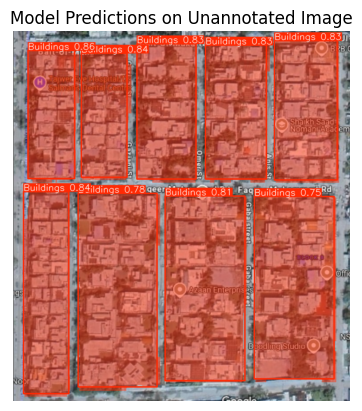

Predictions:
Label: 0.0, Confidence: 0.8625, Coordinates: [33.81268310546875, 43.174373626708984, 137.21409606933594, 329.50970458984375]
Label: 0.0, Confidence: 0.8402, Coordinates: [23.680145263671875, 358.4466857910156, 124.84358215332031, 809.4066162109375]
Label: 0.0, Confidence: 0.8360, Coordinates: [152.1575927734375, 49.8563346862793, 254.794189453125, 326.5022888183594]
Label: 0.0, Confidence: 0.8342, Coordinates: [583.6762084960938, 21.101449966430664, 723.3762817382812, 332.22119140625]
Label: 0.0, Confidence: 0.8322, Coordinates: [429.8508605957031, 31.788156509399414, 565.8583374023438, 330.6976318359375]
Label: 0.0, Confidence: 0.8307, Coordinates: [276.0621337890625, 28.060792922973633, 408.6768798828125, 330.7887268066406]
Label: 0.0, Confidence: 0.8132, Coordinates: [339.5367126464844, 368.0634460449219, 517.1112670898438, 780.6129150390625]
Label: 0.0, Confidence: 0.7794, Coordinates: [145.65696716308594, 362.93505859375, 321.2204284667969, 794.2317504882812]
Label: 0

In [8]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

# Load the trained model
model_path = "/kaggle/working/output_model/epoc2/weights/best.pt"  # Update with your trained model's path
model = YOLO(model_path)

# Path to the unannotated sample image
sample_image_path = "/kaggle/input/samples/1_png.rf.1ec52e517ea1d901196db41f52a5ba2e.jpg"  # Update with the image you want to test

# Perform inference
results = model(sample_image_path)

# Access the first result in the list (the image you passed for testing)
result = results[0]

# Annotate the image with predictions
annotated_image_np = result.plot()  # Get the annotated image as a NumPy array

# Convert NumPy array to a PIL image
annotated_image = Image.fromarray(np.uint8(annotated_image_np))

# Save the annotated image to a file
output_dir = "/kaggle/working/inference_results"
os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists
annotated_image_path = os.path.join(output_dir, "annotated_image.jpg")
annotated_image.save(annotated_image_path)

# Display the annotated image
plt.imshow(annotated_image)
plt.axis("off")
plt.title("Model Predictions on Unannotated Image")
plt.show()

# Print the predictions (bounding boxes, labels, confidence scores)
print("Predictions:")
for i in range(len(result.boxes)):
    # Access the class, confidence, and coordinates
    label = result.boxes.cls[i].item()  # Get the class index (e.g., 'Buildings')
    confidence = result.boxes.conf[i].item()  # Confidence score
    coordinates = result.boxes.xyxy[i].tolist()  # Bounding box coordinates [x1, y1, x2, y2]
    
    print(f"Label: {label}, Confidence: {confidence:.4f}, Coordinates: {coordinates}")



image 1/1 /kaggle/input/samples/1_png.rf.200ca3cbb24292901ff53072a61df9e5.jpg: 512x512 14 Buildingss, 16.1ms
Speed: 1.8ms preprocess, 16.1ms inference, 3.8ms postprocess per image at shape (1, 3, 512, 512)


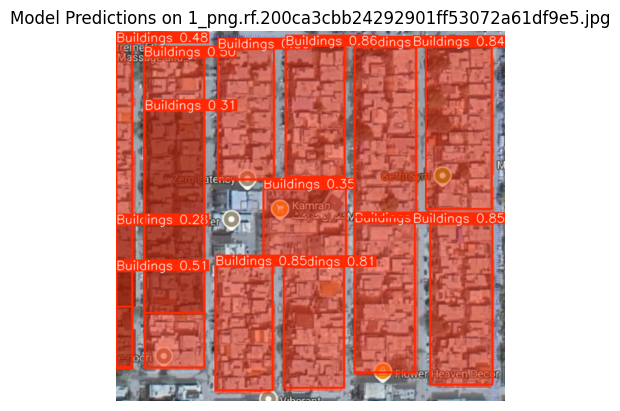

Predictions for 1_png.rf.200ca3cbb24292901ff53072a61df9e5.jpg:
Label: 0.0, Confidence: 0.8603, Coordinates: [275.9110412597656, 24.96556282043457, 371.2202453613281, 237.88638305664062]
Label: 0.0, Confidence: 0.8506, Coordinates: [510.9009094238281, 313.0767822265625, 611.5318603515625, 575.506103515625]
Label: 0.0, Confidence: 0.8482, Coordinates: [161.17465209960938, 382.1370849609375, 254.48960876464844, 584.0050048828125]
Label: 0.0, Confidence: 0.8391, Coordinates: [503.9046630859375, 25.48151969909668, 610.3104248046875, 289.5556335449219]
Label: 0.0, Confidence: 0.8098, Coordinates: [272.2048645019531, 383.14544677734375, 370.2666931152344, 580.7579345703125]
Label: 0.0, Confidence: 0.8095, Coordinates: [387.76190185546875, 26.520265579223633, 487.9381103515625, 302.99468994140625]
Label: 0.0, Confidence: 0.7984, Coordinates: [165.3290252685547, 29.112817764282227, 256.69915771484375, 241.8293914794922]
Label: 0.0, Confidence: 0.7461, Coordinates: [387.3077697753906, 312.947143

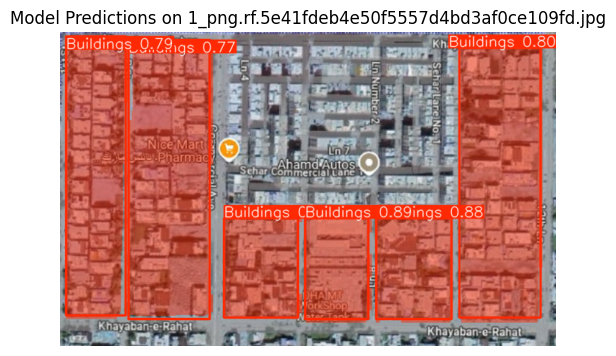

Predictions for 1_png.rf.5e41fdeb4e50f5557d4bd3af0ce109fd.jpg:
Label: 0.0, Confidence: 0.8941, Coordinates: [341.715087890625, 260.4138488769531, 429.7669677734375, 400.9245910644531]
Label: 0.0, Confidence: 0.8804, Coordinates: [440.04095458984375, 260.0324401855469, 545.4342041015625, 400.1774597167969]
Label: 0.0, Confidence: 0.8799, Coordinates: [228.5154571533203, 260.2657165527344, 331.2645568847656, 398.1258544921875]
Label: 0.0, Confidence: 0.7964, Coordinates: [556.5510864257812, 23.93419075012207, 669.1599731445312, 398.64825439453125]
Label: 0.0, Confidence: 0.7918, Coordinates: [8.283821105957031, 7.5223588943481445, 91.48287200927734, 395.7554016113281]
Label: 0.0, Confidence: 0.7750, Coordinates: [95.1477279663086, 12.100231170654297, 208.1727294921875, 400.41619873046875]

image 1/1 /kaggle/input/samples/2_png.rf.1690483c12e85608ecab4aef66d31f32.jpg: 512x512 16 Buildingss, 17.3ms
Speed: 2.0ms preprocess, 17.3ms inference, 4.1ms postprocess per image at shape (1, 3, 512, 

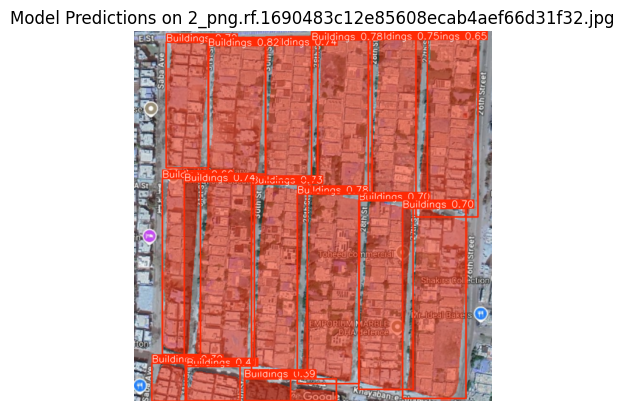

Predictions for 2_png.rf.1690483c12e85608ecab4aef66d31f32.jpg:
Label: 0.0, Confidence: 0.8203, Coordinates: [155.71580505371094, 13.70697021484375, 275.5067443847656, 300.37982177734375]
Label: 0.0, Confidence: 0.7805, Coordinates: [372.76025390625, 1.575584888458252, 499.6539306640625, 338.23980712890625]
Label: 0.0, Confidence: 0.7767, Coordinates: [342.6869812011719, 342.06781005859375, 472.3741760253906, 740.773681640625]
Label: 0.0, Confidence: 0.7538, Coordinates: [491.8749084472656, 0.0, 615.2333374023438, 354.0125427246094]
Label: 0.0, Confidence: 0.7438, Coordinates: [105.5998764038086, 316.40106201171875, 252.8884735107422, 700.9503784179688]
Label: 0.0, Confidence: 0.7385, Coordinates: [276.527587890625, 12.104269027709961, 385.1676940917969, 313.2274169921875]
Label: 0.0, Confidence: 0.7297, Coordinates: [246.92840576171875, 321.60382080078125, 363.76776123046875, 713.5587768554688]
Label: 0.0, Confidence: 0.7195, Coordinates: [67.690673828125, 23.738441467285156, 156.50877

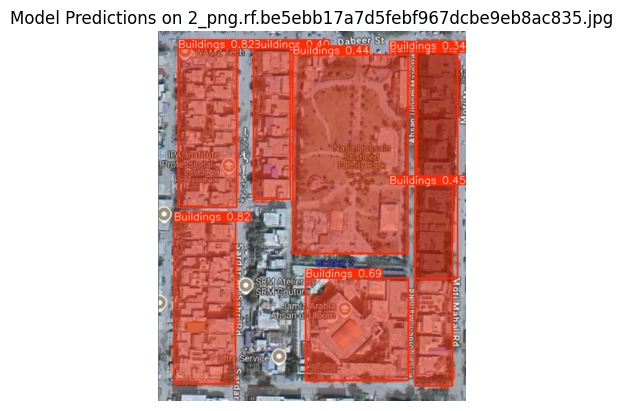

Predictions for 2_png.rf.be5ebb17a7d5febf967dcbe9eb8ac835.jpg:
Label: 0.0, Confidence: 0.8226, Coordinates: [39.283470153808594, 34.51213073730469, 153.21209716796875, 344.2100524902344]
Label: 0.0, Confidence: 0.8152, Coordinates: [31.911590576171875, 371.4354553222656, 151.6179656982422, 689.0265502929688]
Label: 0.0, Confidence: 0.6865, Coordinates: [288.8255920410156, 482.717529296875, 489.6253967285156, 682.4866943359375]
Label: 0.0, Confidence: 0.4459, Coordinates: [502.05255126953125, 300.4817810058594, 575.5479125976562, 693.0175170898438]
Label: 0.0, Confidence: 0.4383, Coordinates: [263.5415344238281, 46.657657623291016, 488.4328918457031, 434.70843505859375]
Label: 0.0, Confidence: 0.4000, Coordinates: [186.5938262939453, 34.76509094238281, 258.0145568847656, 328.11541748046875]
Label: 0.0, Confidence: 0.3416, Coordinates: [502.9521789550781, 37.610557556152344, 585.0074462890625, 483.4273376464844]
Label: 0.0, Confidence: 0.2625, Coordinates: [505.7780456542969, 42.30721664

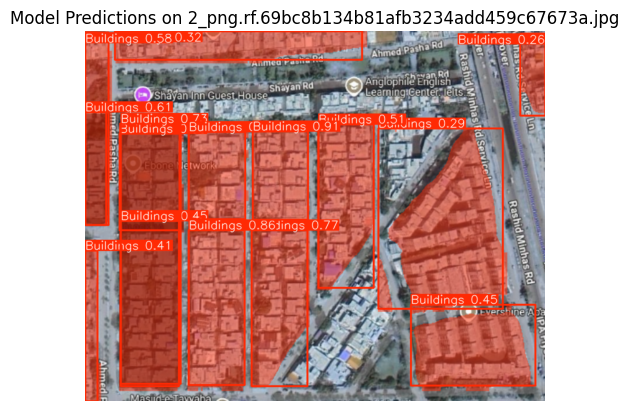

Predictions for 2_png.rf.69bc8b134b81afb3234add459c67673a.jpg:
Label: 0.0, Confidence: 0.9077, Coordinates: [288.8251953125, 172.7053680419922, 383.1806640625, 324.1299133300781]
Label: 0.0, Confidence: 0.8597, Coordinates: [178.3095703125, 342.87078857421875, 274.89434814453125, 608.7380981445312]
Label: 0.0, Confidence: 0.7953, Coordinates: [178.73056030273438, 173.19435119628906, 275.86590576171875, 323.4417419433594]
Label: 0.0, Confidence: 0.7685, Coordinates: [286.6912841796875, 342.0133972167969, 382.4674377441406, 610.4417724609375]
Label: 0.0, Confidence: 0.7262, Coordinates: [61.01693344116211, 159.8355712890625, 164.22369384765625, 606.5702514648438]
Label: 0.0, Confidence: 0.6087, Coordinates: [0.0, 139.58628845214844, 36.70323944091797, 333.8935852050781]
Label: 0.0, Confidence: 0.5819, Coordinates: [0.0, 2.248264789581299, 40.389808654785156, 333.8302307128906]
Label: 0.0, Confidence: 0.5116, Coordinates: [401.0016174316406, 160.66319274902344, 496.94952392578125, 441.336

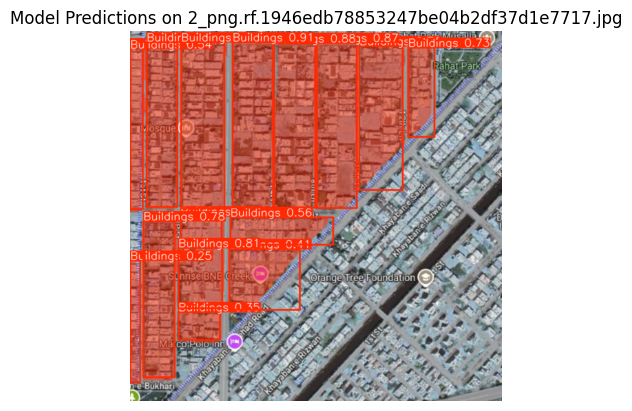

Predictions for 2_png.rf.1946edb78853247be04b2df37d1e7717.jpg:
Label: 0.0, Confidence: 0.9060, Coordinates: [187.56016540527344, 20.869016647338867, 261.17181396484375, 322.672119140625]
Label: 0.0, Confidence: 0.8849, Coordinates: [263.9296569824219, 22.545467376708984, 338.8305969238281, 322.4781494140625]
Label: 0.0, Confidence: 0.8847, Coordinates: [93.70621490478516, 20.725740432739258, 172.5934295654297, 323.1109619140625]
Label: 0.0, Confidence: 0.8663, Coordinates: [341.5300598144531, 21.296165466308594, 414.26776123046875, 323.888671875]
Label: 0.0, Confidence: 0.8501, Coordinates: [30.28542137145996, 20.819568634033203, 86.6933822631836, 321.39984130859375]
Label: 0.0, Confidence: 0.8121, Coordinates: [88.77861785888672, 396.29803466796875, 168.13638305664062, 506.69891357421875]
Label: 0.0, Confidence: 0.7801, Coordinates: [24.912755966186523, 347.7306213378906, 81.30237579345703, 632.7167358398438]
Label: 0.0, Confidence: 0.7275, Coordinates: [508.6802978515625, 30.35232543

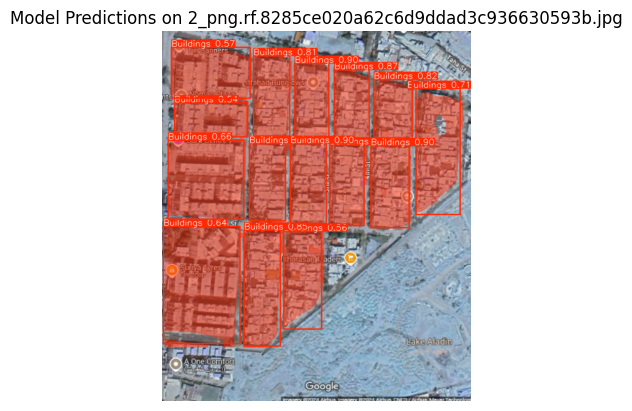

Predictions for 2_png.rf.8285ce020a62c6d9ddad3c936630593b.jpg:
Label: 0.0, Confidence: 0.9043, Coordinates: [312.4308776855469, 76.75299835205078, 392.1570739746094, 250.98822021484375]
Label: 0.0, Confidence: 0.9040, Coordinates: [302.01422119140625, 265.2571105957031, 386.3132019042969, 453.6961364746094]
Label: 0.0, Confidence: 0.8959, Coordinates: [491.1464538574219, 270.489501953125, 581.8145751953125, 463.6361999511719]
Label: 0.0, Confidence: 0.8738, Coordinates: [394.539794921875, 268.9169616699219, 475.94873046875, 458.638671875]
Label: 0.0, Confidence: 0.8729, Coordinates: [405.9034423828125, 91.20452117919922, 487.7913818359375, 253.71559143066406]
Label: 0.0, Confidence: 0.8661, Coordinates: [205.23190307617188, 265.0420837402344, 290.3699645996094, 447.291748046875]
Label: 0.0, Confidence: 0.8461, Coordinates: [193.39852905273438, 469.84906005859375, 278.8055114746094, 742.5616455078125]
Label: 0.0, Confidence: 0.8215, Coordinates: [498.4655456542969, 114.87279510498047, 5

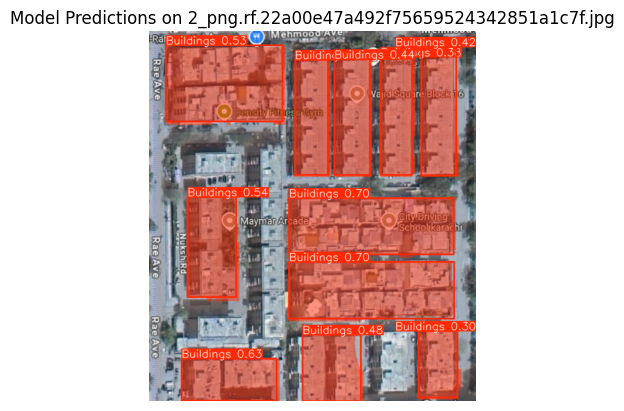

Predictions for 2_png.rf.22a00e47a492f75659524342851a1c7f.jpg:
Label: 0.0, Confidence: 0.6959, Coordinates: [259.7908630371094, 427.2679138183594, 565.9598388671875, 532.17822265625]
Label: 0.0, Confidence: 0.6952, Coordinates: [259.9295959472656, 309.11651611328125, 564.5128173828125, 413.0492248535156]
Label: 0.0, Confidence: 0.6307, Coordinates: [60.66881561279297, 606.52197265625, 236.59390258789062, 684.6595458984375]
Label: 0.0, Confidence: 0.5360, Coordinates: [71.59709167480469, 307.7995910644531, 161.479248046875, 492.4204406738281]
Label: 0.0, Confidence: 0.5345, Coordinates: [31.910945892333984, 26.94633674621582, 247.87347412109375, 167.75035095214844]
Label: 0.0, Confidence: 0.4812, Coordinates: [284.529296875, 562.9517211914062, 392.6933898925781, 685.0]
Label: 0.0, Confidence: 0.4376, Coordinates: [343.1201171875, 52.8857536315918, 409.60601806640625, 266.9689636230469]
Label: 0.0, Confidence: 0.4155, Coordinates: [504.8065185546875, 29.247943878173828, 569.0690307617188

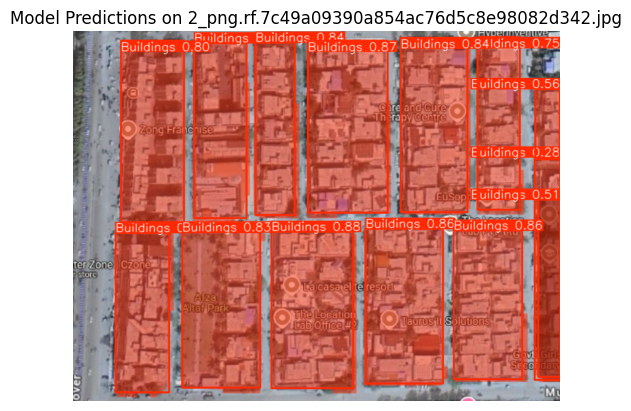

Predictions for 2_png.rf.7c49a09390a854ac76d5c8e98082d342.jpg:
Label: 0.0, Confidence: 0.8782, Coordinates: [333.9518127441406, 337.05364990234375, 470.6263122558594, 600.2105712890625]
Label: 0.0, Confidence: 0.8659, Coordinates: [394.54644775390625, 16.801790237426758, 528.6920776367188, 305.23614501953125]
Label: 0.0, Confidence: 0.8584, Coordinates: [639.9239501953125, 335.3020935058594, 754.6307373046875, 585.4595947265625]
Label: 0.0, Confidence: 0.8576, Coordinates: [491.7018737792969, 332.71099853515625, 621.236572265625, 592.0296020507812]
Label: 0.0, Confidence: 0.8416, Coordinates: [550.4459838867188, 11.851387977600098, 662.6190795898438, 304.5265197753906]
Label: 0.0, Confidence: 0.8362, Coordinates: [306.0536804199219, 19.160781860351562, 372.8371887207031, 309.461669921875]
Label: 0.0, Confidence: 0.8269, Coordinates: [183.3762969970703, 338.5255432128906, 314.2926330566406, 599.2705078125]
Label: 0.0, Confidence: 0.8031, Coordinates: [80.13419342041016, 16.3954296112060

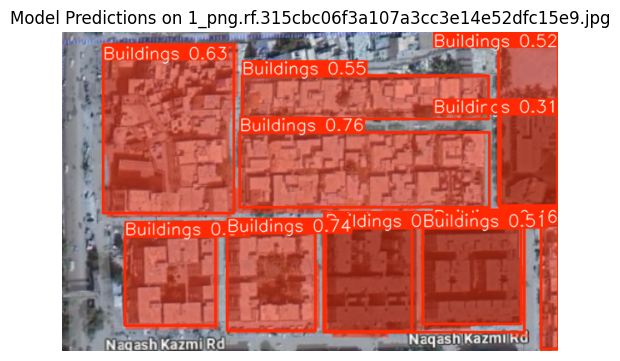

Predictions for 1_png.rf.315cbc06f3a107a3cc3e14e52dfc15e9.jpg:
Label: 0.0, Confidence: 0.7611, Coordinates: [213.4938201904297, 120.58206176757812, 513.0040283203125, 210.7482452392578]
Label: 0.0, Confidence: 0.7401, Coordinates: [198.07769775390625, 241.33172607421875, 304.01214599609375, 358.6002502441406]
Label: 0.0, Confidence: 0.6277, Coordinates: [49.0817985534668, 15.114553451538086, 206.5062255859375, 217.25271606445312]
Label: 0.0, Confidence: 0.5520, Coordinates: [216.59693908691406, 52.254337310791016, 512.7014770507812, 104.4118881225586]
Label: 0.0, Confidence: 0.5243, Coordinates: [524.1394653320312, 0.0, 596.0, 208.55062866210938]
Label: 0.0, Confidence: 0.5124, Coordinates: [75.69374084472656, 245.04104614257812, 184.4899139404297, 352.7240905761719]
Label: 0.0, Confidence: 0.5074, Coordinates: [433.13812255859375, 235.99610900878906, 551.1414184570312, 350.9919128417969]
Label: 0.0, Confidence: 0.4906, Coordinates: [316.7901916503906, 235.93539428710938, 420.041351318

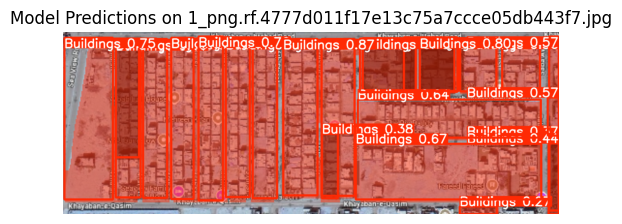

Predictions for 1_png.rf.4777d011f17e13c75a7ccce05db443f7.jpg:
Label: 0.0, Confidence: 0.8676, Coordinates: [540.7874755859375, 19.161645889282227, 624.4483642578125, 401.4822692871094]
Label: 0.0, Confidence: 0.8014, Coordinates: [875.7048950195312, 16.336397171020508, 960.5315551757812, 146.96998596191406]
Label: 0.0, Confidence: 0.7646, Coordinates: [332.2283935546875, 13.726780891418457, 392.7099609375, 413.2669677734375]
Label: 0.0, Confidence: 0.7486, Coordinates: [3.7085578441619873, 16.750164031982422, 122.22551727294922, 411.19293212890625]
Label: 0.0, Confidence: 0.7453, Coordinates: [265.1629333496094, 16.426496505737305, 320.68499755859375, 410.95208740234375]
Label: 0.0, Confidence: 0.7234, Coordinates: [728.4703979492188, 18.46795654296875, 865.0181274414062, 149.78530883789062]
Label: 0.0, Confidence: 0.6875, Coordinates: [634.7364501953125, 19.355396270751953, 715.7908935546875, 402.28973388671875]
Label: 0.0, Confidence: 0.6688, Coordinates: [718.867431640625, 275.4850

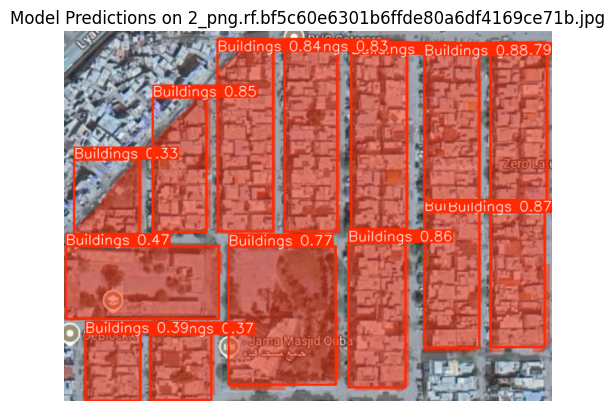

Predictions for 2_png.rf.bf5c60e6301b6ffde80a6df4169ce71b.jpg:
Label: 0.0, Confidence: 0.8793, Coordinates: [517.7144165039062, 17.94068145751953, 596.90283203125, 244.04275512695312]
Label: 0.0, Confidence: 0.8748, Coordinates: [612.1637573242188, 260.352294921875, 690.9404907226562, 453.0396423339844]
Label: 0.0, Confidence: 0.8642, Coordinates: [408.6419372558594, 303.5941162109375, 490.3957824707031, 511.49774169921875]
Label: 0.0, Confidence: 0.8460, Coordinates: [127.10369873046875, 95.21101379394531, 204.54571533203125, 288.9284973144531]
Label: 0.0, Confidence: 0.8443, Coordinates: [220.69158935546875, 11.712424278259277, 300.874267578125, 287.12286376953125]
Label: 0.0, Confidence: 0.8316, Coordinates: [316.93768310546875, 11.17148208618164, 392.1869201660156, 287.26849365234375]
Label: 0.0, Confidence: 0.8271, Coordinates: [412.45159912109375, 15.270380020141602, 492.77764892578125, 284.0657043457031]
Label: 0.0, Confidence: 0.8013, Coordinates: [517.0635375976562, 259.385894

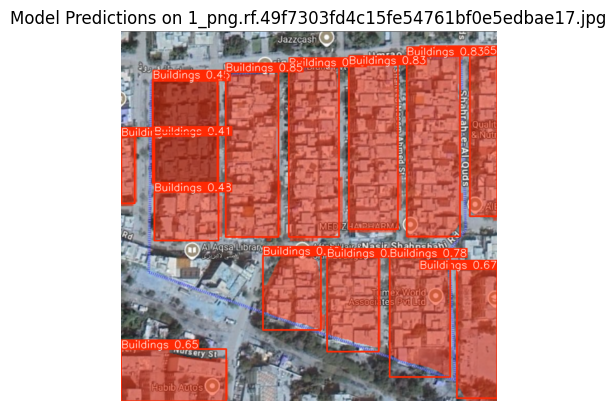

Predictions for 1_png.rf.49f7303fd4c15fe54761bf0e5edbae17.jpg:
Label: 0.0, Confidence: 0.8453, Coordinates: [202.15306091308594, 79.8501968383789, 304.164794921875, 398.0419921875]
Label: 0.0, Confidence: 0.8314, Coordinates: [440.80047607421875, 65.8433837890625, 535.5547485351562, 383.73358154296875]
Label: 0.0, Confidence: 0.8272, Coordinates: [552.2584228515625, 48.76968765258789, 655.529541015625, 397.4795837402344]
Label: 0.0, Confidence: 0.7940, Coordinates: [324.1098327636719, 69.08040618896484, 421.3077392578125, 398.89569091796875]
Label: 0.0, Confidence: 0.7799, Coordinates: [519.6907348632812, 438.98876953125, 636.17041015625, 669.3984985351562]
Label: 0.0, Confidence: 0.7040, Coordinates: [398.3168640136719, 438.87310791015625, 498.0905456542969, 620.3814697265625]
Label: 0.0, Confidence: 0.6719, Coordinates: [649.5682983398438, 461.3211975097656, 727.0, 710.4214477539062]
Label: 0.0, Confidence: 0.6509, Coordinates: [674.235595703125, 46.716156005859375, 727.0, 358.724304

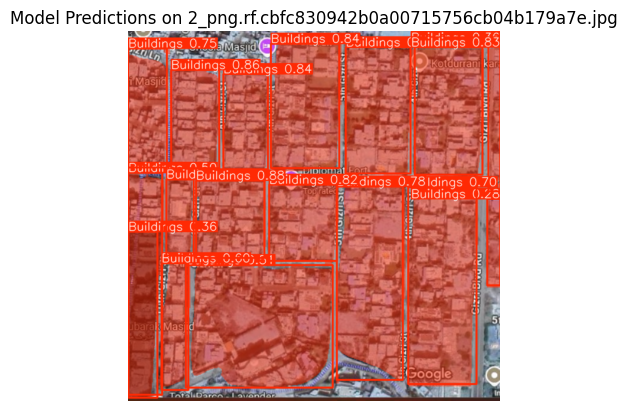

Predictions for 2_png.rf.cbfc830942b0a00715756cb04b179a7e.jpg:
Label: 0.0, Confidence: 0.8764, Coordinates: [114.5796890258789, 251.6741180419922, 229.10574340820312, 381.3667297363281]
Label: 0.0, Confidence: 0.8577, Coordinates: [72.4115219116211, 65.40338134765625, 153.0325469970703, 230.7126007080078]
Label: 0.0, Confidence: 0.8437, Coordinates: [160.9137725830078, 72.30757141113281, 235.24252319335938, 232.760498046875]
Label: 0.0, Confidence: 0.8367, Coordinates: [240.80870056152344, 21.412809371948242, 355.3814392089844, 230.89552307128906]
Label: 0.0, Confidence: 0.8338, Coordinates: [482.55780029296875, 27.75662612915039, 596.3096923828125, 241.60682678222656]
Label: 0.0, Confidence: 0.8209, Coordinates: [237.42138671875, 258.72564697265625, 351.589599609375, 386.0608825683594]
Label: 0.0, Confidence: 0.8186, Coordinates: [366.2963562011719, 27.476482391357422, 475.1428527832031, 239.43380737304688]
Label: 0.0, Confidence: 0.7784, Coordinates: [351.7828369140625, 261.103057861

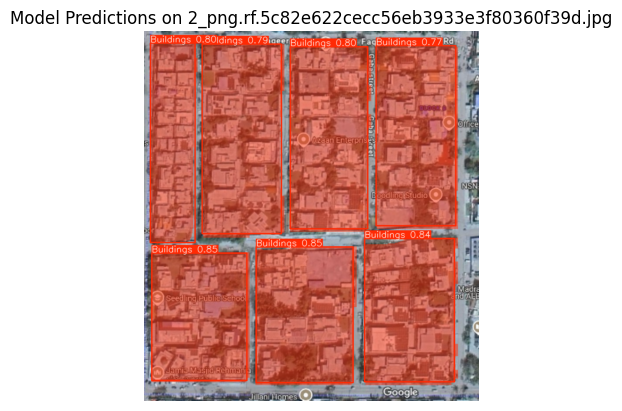

Predictions for 2_png.rf.5c82e622cecc56eb3933e3f80360f39d.jpg:
Label: 0.0, Confidence: 0.8540, Coordinates: [17.259952545166016, 502.7643737792969, 232.37026977539062, 790.8070068359375]
Label: 0.0, Confidence: 0.8492, Coordinates: [253.49034118652344, 488.6876220703125, 472.173828125, 795.6337280273438]
Label: 0.0, Confidence: 0.8447, Coordinates: [498.22735595703125, 469.57464599609375, 701.8172607421875, 793.7744750976562]
Label: 0.0, Confidence: 0.8047, Coordinates: [330.9422912597656, 35.464805603027344, 505.6946105957031, 447.1683654785156]
Label: 0.0, Confidence: 0.8043, Coordinates: [14.604781150817871, 27.27581024169922, 115.36829376220703, 478.3934326171875]
Label: 0.0, Confidence: 0.7895, Coordinates: [131.37570190429688, 29.27277183532715, 310.0329284667969, 458.2966613769531]
Label: 0.0, Confidence: 0.7723, Coordinates: [524.8828735351562, 33.65449142456055, 704.5967407226562, 440.8871154785156]

image 1/1 /kaggle/input/samples/1_png.rf.fe30dcc4681ffdce38061f4ad6870071.jpg

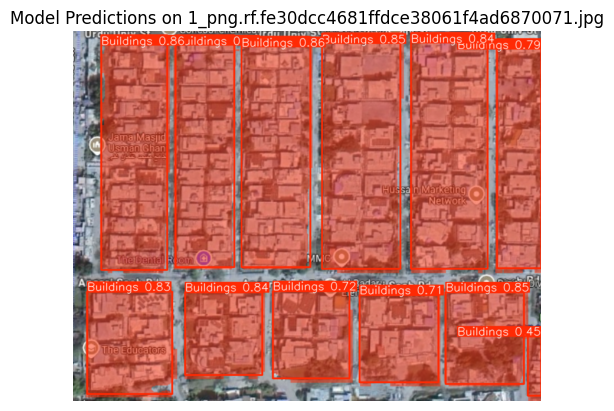

Predictions for 1_png.rf.fe30dcc4681ffdce38061f4ad6870071.jpg:
Label: 0.0, Confidence: 0.8604, Coordinates: [301.71099853515625, 10.029203414916992, 424.4881286621094, 422.60577392578125]
Label: 0.0, Confidence: 0.8552, Coordinates: [50.931575775146484, 7.455724716186523, 168.1970672607422, 427.19427490234375]
Label: 0.0, Confidence: 0.8501, Coordinates: [666.6435546875, 467.32354736328125, 806.553466796875, 631.3622436523438]
Label: 0.0, Confidence: 0.8495, Coordinates: [183.06053161621094, 7.080920219421387, 288.7375793457031, 422.9732971191406]
Label: 0.0, Confidence: 0.8484, Coordinates: [445.9794006347656, 4.685583114624023, 585.1695556640625, 425.5180969238281]
Label: 0.0, Confidence: 0.8432, Coordinates: [604.8201904296875, 3.765927791595459, 741.8090209960938, 425.822021484375]
Label: 0.0, Confidence: 0.8402, Coordinates: [200.2825927734375, 467.6775817871094, 338.3453063964844, 615.076904296875]
Label: 0.0, Confidence: 0.8293, Coordinates: [25.247421264648438, 466.569519042968

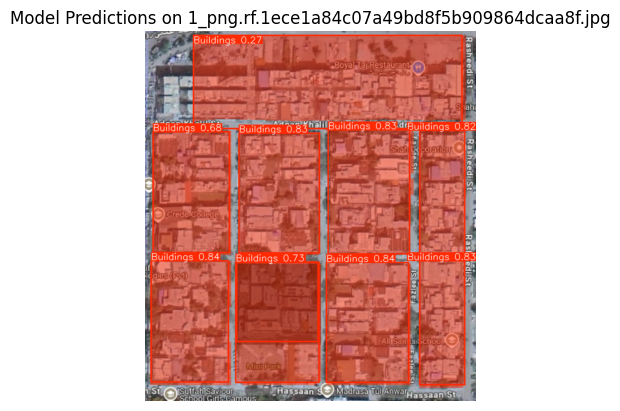

Predictions for 1_png.rf.1ece1a84c07a49bd8f5b909864dcaa8f.jpg:
Label: 0.0, Confidence: 0.8386, Coordinates: [394.0864562988281, 504.27685546875, 573.3592529296875, 765.2990112304688]
Label: 0.0, Confidence: 0.8383, Coordinates: [13.41712474822998, 500.5096130371094, 181.63121032714844, 764.1533203125]
Label: 0.0, Confidence: 0.8311, Coordinates: [204.50311279296875, 222.16099548339844, 379.76177978515625, 483.17034912109375]
Label: 0.0, Confidence: 0.8305, Coordinates: [398.9860534667969, 215.15945434570312, 575.923828125, 485.1576232910156]
Label: 0.0, Confidence: 0.8278, Coordinates: [597.8065185546875, 500.5784912109375, 695.4463500976562, 770.8141479492188]
Label: 0.0, Confidence: 0.8211, Coordinates: [597.7777709960938, 216.37037658691406, 695.5148315429688, 486.1000061035156]
Label: 0.0, Confidence: 0.7299, Coordinates: [197.3971710205078, 503.5268859863281, 378.03997802734375, 765.5659790039062]
Label: 0.0, Confidence: 0.6794, Coordinates: [17.52939796447754, 219.6261444091797, 

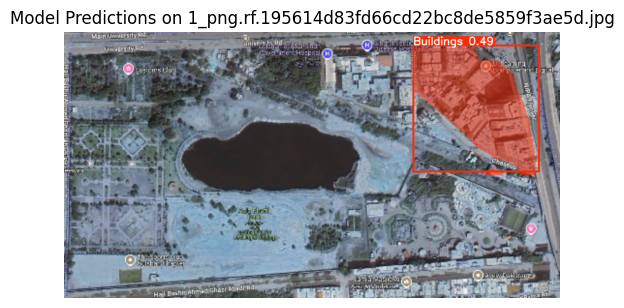

Predictions for 1_png.rf.195614d83fd66cd22bc8de5859f3ae5d.jpg:
Label: 0.0, Confidence: 0.4879, Coordinates: [973.9266967773438, 37.92283630371094, 1323.83349609375, 388.02777099609375]

image 1/1 /kaggle/input/samples/1_png.rf.1020c11dd3803da6e29e74409c57efe4.jpg: 512x512 20 Buildingss, 17.0ms
Speed: 2.1ms preprocess, 17.0ms inference, 4.5ms postprocess per image at shape (1, 3, 512, 512)


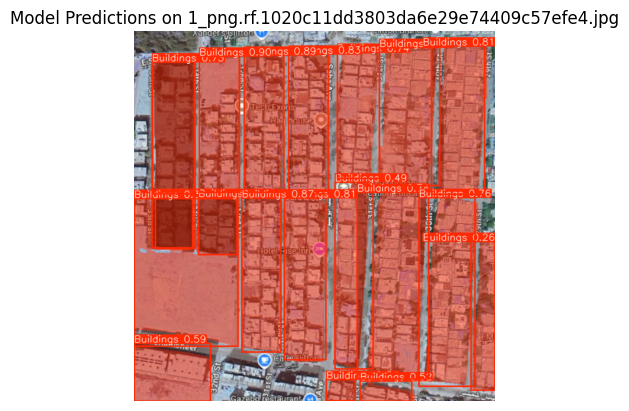

Predictions for 1_png.rf.1020c11dd3803da6e29e74409c57efe4.jpg:
Label: 0.0, Confidence: 0.8956, Coordinates: [135.76962280273438, 52.72509765625, 218.7825927734375, 334.6414794921875]
Label: 0.0, Confidence: 0.8906, Coordinates: [228.66331481933594, 50.33858871459961, 310.316650390625, 334.8182678222656]
Label: 0.0, Confidence: 0.8671, Coordinates: [223.2452392578125, 346.86328125, 304.3092041015625, 665.7459106445312]
Label: 0.0, Confidence: 0.8312, Coordinates: [320.7077941894531, 48.06551742553711, 402.24200439453125, 337.343994140625]
Label: 0.0, Confidence: 0.8142, Coordinates: [616.6585083007812, 31.18507194519043, 726.24609375, 338.00689697265625]
Label: 0.0, Confidence: 0.8131, Coordinates: [311.91009521484375, 346.164306640625, 397.6022644042969, 681.057861328125]
Label: 0.0, Confidence: 0.7911, Coordinates: [508.0193786621094, 34.484519958496094, 633.9535522460938, 320.700439453125]
Label: 0.0, Confidence: 0.7751, Coordinates: [133.58677673339844, 345.7465515136719, 213.577560

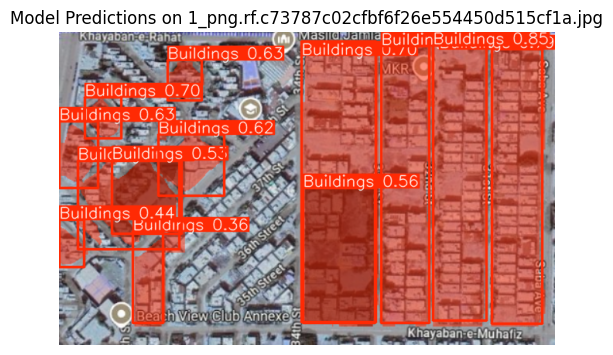

Predictions for 1_png.rf.c73787c02cfbf6f26e554450d515cf1a.jpg:
Label: 0.0, Confidence: 0.8492, Coordinates: [483.76519775390625, 18.521364212036133, 552.7129516601562, 373.9142761230469]
Label: 0.0, Confidence: 0.7871, Coordinates: [559.0625610351562, 23.99587059020996, 624.03759765625, 377.6566467285156]
Label: 0.0, Confidence: 0.7593, Coordinates: [416.1805725097656, 19.326223373413086, 478.8580017089844, 376.6626892089844]
Label: 0.0, Confidence: 0.7030, Coordinates: [33.36498260498047, 85.25079345703125, 80.57381439208984, 138.77239990234375]
Label: 0.0, Confidence: 0.7013, Coordinates: [313.18475341796875, 13.92740535736084, 409.90850830078125, 375.7789611816406]
Label: 0.0, Confidence: 0.6297, Coordinates: [0.7572209239006042, 116.1479721069336, 50.02534103393555, 202.26988220214844]
Label: 0.0, Confidence: 0.6270, Coordinates: [140.9071044921875, 37.64986801147461, 184.12428283691406, 89.27520751953125]
Label: 0.0, Confidence: 0.6231, Coordinates: [128.01612854003906, 133.053268

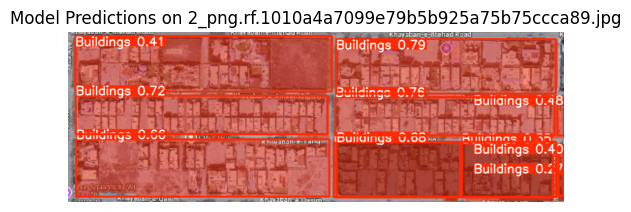

Predictions for 2_png.rf.1010a4a7099e79b5b925a75b75ccca89.jpg:
Label: 0.0, Confidence: 0.7929, Coordinates: [670.1513061523438, 20.241004943847656, 1219.45068359375, 155.16685485839844]
Label: 0.0, Confidence: 0.7603, Coordinates: [668.9771728515625, 164.36532592773438, 1216.722412109375, 259.0936279296875]
Label: 0.0, Confidence: 0.7218, Coordinates: [19.942922592163086, 160.57801818847656, 648.3748168945312, 256.46380615234375]
Label: 0.0, Confidence: 0.6754, Coordinates: [671.7606811523438, 276.8304138183594, 980.3147583007812, 413.7806091308594]
Label: 0.0, Confidence: 0.6554, Coordinates: [20.619861602783203, 269.6786804199219, 653.0303344726562, 411.9060974121094]
Label: 0.0, Confidence: 0.5517, Coordinates: [664.87060546875, 275.34149169921875, 1220.2218017578125, 412.7110595703125]
Label: 0.0, Confidence: 0.4838, Coordinates: [1223.3182373046875, 184.84921264648438, 1239.6695556640625, 259.6792907714844]
Label: 0.0, Confidence: 0.4077, Coordinates: [18.968717575073242, 12.33116

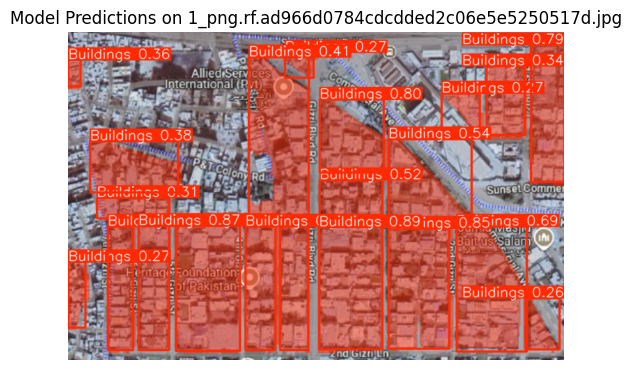

Predictions for 1_png.rf.ad966d0784cdcdded2c06e5e5250517d.jpg:
Label: 0.0, Confidence: 0.8945, Coordinates: [368.5009765625, 287.34423828125, 461.1821594238281, 466.92730712890625]
Label: 0.0, Confidence: 0.8760, Coordinates: [260.1756286621094, 286.63470458984375, 304.67742919921875, 467.1232604980469]
Label: 0.0, Confidence: 0.8657, Coordinates: [103.3731689453125, 285.83001708984375, 148.01144409179688, 467.4256896972656]
Label: 0.0, Confidence: 0.8627, Coordinates: [311.1726989746094, 286.4496154785156, 352.5195617675781, 467.9001770019531]
Label: 0.0, Confidence: 0.8542, Coordinates: [158.30026245117188, 285.3623962402344, 252.1776123046875, 468.19439697265625]
Label: 0.0, Confidence: 0.8472, Coordinates: [470.1564636230469, 289.5966796875, 559.1464233398438, 465.98260498046875]
Label: 0.0, Confidence: 0.7965, Coordinates: [369.7894287109375, 100.0174789428711, 463.6001892089844, 207.22328186035156]
Label: 0.0, Confidence: 0.7915, Coordinates: [679.7603759765625, 20.78385734558105

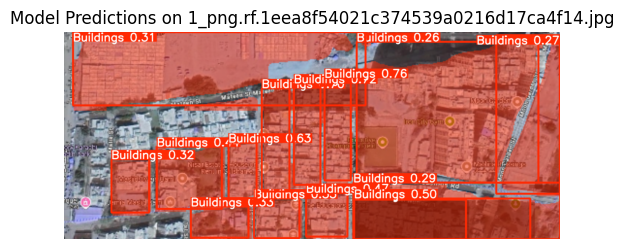

Predictions for 1_png.rf.1eea8f54021c374539a0216d17ca4f14.jpg:
Label: 0.0, Confidence: 0.7611, Coordinates: [705.6098022460938, 124.00341796875, 776.5023193359375, 401.1468505859375]
Label: 0.0, Confidence: 0.7214, Coordinates: [622.7474365234375, 139.0252227783203, 694.1636352539062, 413.4328308105469]
Label: 0.0, Confidence: 0.6981, Coordinates: [535.839599609375, 152.9811553955078, 610.4581909179688, 431.0872802734375]
Label: 0.0, Confidence: 0.6260, Coordinates: [445.3468933105469, 299.28179931640625, 521.8388671875, 449.8840026855469]
Label: 0.0, Confidence: 0.5020, Coordinates: [785.3103637695312, 450.4501037597656, 1262.5413818359375, 560.0]
Label: 0.0, Confidence: 0.4672, Coordinates: [655.1604614257812, 435.2869873046875, 767.2973022460938, 553.4947509765625]
Label: 0.0, Confidence: 0.4355, Coordinates: [251.6875762939453, 310.8473205566406, 427.88897705078125, 478.76409912109375]
Label: 0.0, Confidence: 0.4093, Coordinates: [785.4746704101562, 453.3673400878906, 1088.14746093

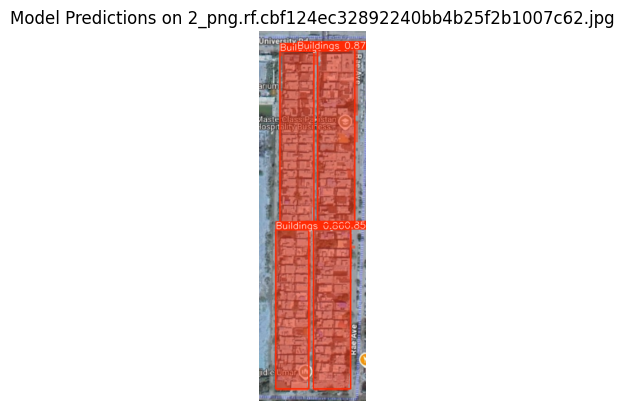

Predictions for 2_png.rf.cbf124ec32892240bb4b25f2b1007c62.jpg:
Label: 0.0, Confidence: 0.8686, Coordinates: [127.88616180419922, 40.85747528076172, 208.09555053710938, 422.02154541015625]
Label: 0.0, Confidence: 0.8614, Coordinates: [36.4522705078125, 433.8337097167969, 108.91597747802734, 780.5079345703125]
Label: 0.0, Confidence: 0.8607, Coordinates: [45.78293991088867, 44.455955505371094, 119.61349487304688, 418.46636962890625]
Label: 0.0, Confidence: 0.8543, Coordinates: [118.63959503173828, 432.3895263671875, 199.99871826171875, 780.181396484375]

image 1/1 /kaggle/input/samples/1_png.rf.7b1df5f1ed8384fe9263518372d439a3.jpg: 512x512 11 Buildingss, 16.9ms
Speed: 1.7ms preprocess, 16.9ms inference, 3.5ms postprocess per image at shape (1, 3, 512, 512)


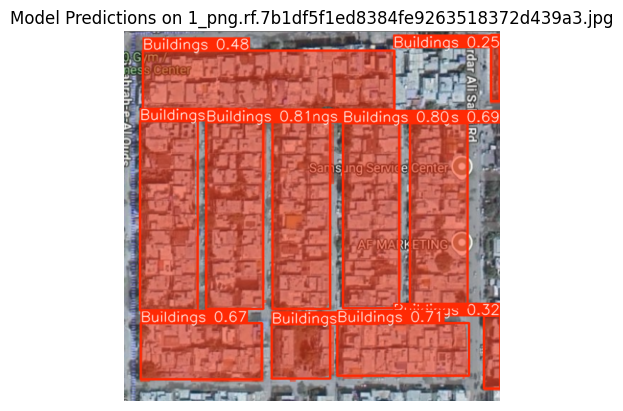

Predictions for 1_png.rf.7b1df5f1ed8384fe9263518372d439a3.jpg:
Label: 0.0, Confidence: 0.8078, Coordinates: [115.36886596679688, 128.76780700683594, 195.62364196777344, 390.15155029296875]
Label: 0.0, Confidence: 0.8000, Coordinates: [307.5032653808594, 129.35140991210938, 386.4176940917969, 389.5196228027344]
Label: 0.0, Confidence: 0.7987, Coordinates: [208.3922119140625, 128.90187072753906, 289.04290771484375, 390.28289794921875]
Label: 0.0, Confidence: 0.7457, Coordinates: [22.143787384033203, 126.00963592529297, 103.13524627685547, 392.4727783203125]
Label: 0.0, Confidence: 0.7079, Coordinates: [299.710693359375, 410.261474609375, 484.14141845703125, 484.5965270996094]
Label: 0.0, Confidence: 0.6867, Coordinates: [401.1343078613281, 129.18011474609375, 482.66448974609375, 388.4255065917969]
Label: 0.0, Confidence: 0.6749, Coordinates: [23.78251075744629, 410.75164794921875, 193.72523498535156, 489.0307312011719]
Label: 0.0, Confidence: 0.6590, Coordinates: [207.7035369873047, 412.

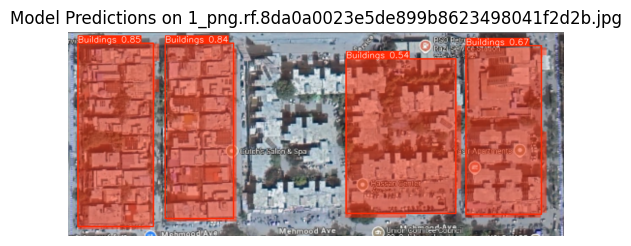

Predictions for 1_png.rf.8da0a0023e5de899b8623498041f2d2b.jpg:
Label: 0.0, Confidence: 0.8494, Coordinates: [23.06201171875, 26.608821868896484, 202.65541076660156, 460.0850830078125]
Label: 0.0, Confidence: 0.8354, Coordinates: [230.60423278808594, 26.56035041809082, 392.7406311035156, 441.8192138671875]
Label: 0.0, Confidence: 0.6733, Coordinates: [943.516845703125, 32.718482971191406, 1122.557861328125, 431.9548645019531]
Label: 0.0, Confidence: 0.5369, Coordinates: [659.2755737304688, 63.978145599365234, 919.986328125, 429.0805358886719]

image 1/1 /kaggle/input/samples/1_png.rf.ccda12ff30942068741e543388bec9c9.jpg: 320x512 5 Buildingss, 50.9ms
Speed: 1.4ms preprocess, 50.9ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 512)


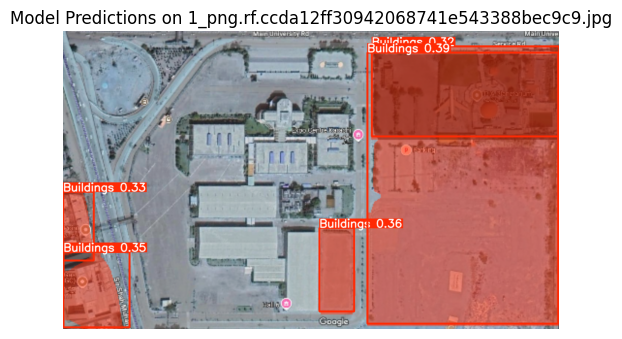

Predictions for 1_png.rf.ccda12ff30942068741e543388bec9c9.jpg:
Label: 0.0, Confidence: 0.3904, Coordinates: [825.2203369140625, 58.138973236083984, 1342.9462890625, 792.0303955078125]
Label: 0.0, Confidence: 0.3563, Coordinates: [695.953369140625, 533.0740356445312, 789.8435668945312, 759.510986328125]
Label: 0.0, Confidence: 0.3547, Coordinates: [1.938027262687683, 598.5598754882812, 180.29762268066406, 802.2817993164062]
Label: 0.0, Confidence: 0.3334, Coordinates: [0.0, 435.8520202636719, 83.631103515625, 621.1771850585938]
Label: 0.0, Confidence: 0.3175, Coordinates: [837.786376953125, 41.506187438964844, 1345.0, 285.1672668457031]

image 1/1 /kaggle/input/samples/1_png.rf.4d4c6cc93464fc714711e1ff974879ff.jpg: 512x512 14 Buildingss, 17.0ms
Speed: 2.1ms preprocess, 17.0ms inference, 3.8ms postprocess per image at shape (1, 3, 512, 512)


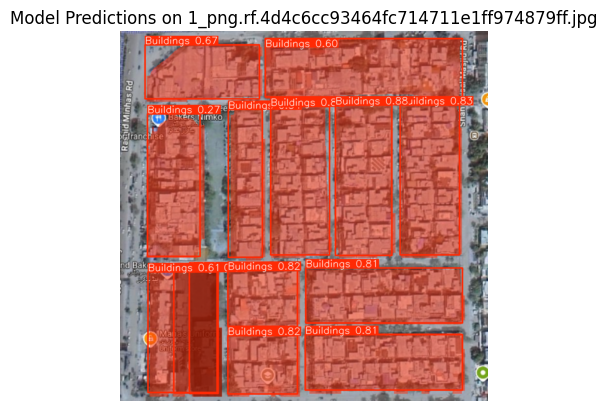

Predictions for 1_png.rf.4d4c6cc93464fc714711e1ff974879ff.jpg:
Label: 0.0, Confidence: 0.8829, Coordinates: [442.6999816894531, 152.7071075439453, 558.1460571289062, 461.45892333984375]
Label: 0.0, Confidence: 0.8773, Coordinates: [309.4000549316406, 155.7015380859375, 430.6786804199219, 460.6187438964844]
Label: 0.0, Confidence: 0.8346, Coordinates: [575.994140625, 152.85601806640625, 697.5421142578125, 460.69287109375]
Label: 0.0, Confidence: 0.8241, Coordinates: [221.38450622558594, 492.0172119140625, 364.3798522949219, 607.6231079101562]
Label: 0.0, Confidence: 0.8214, Coordinates: [221.88694763183594, 626.874755859375, 364.4677734375, 746.24365234375]
Label: 0.0, Confidence: 0.8132, Coordinates: [380.30621337890625, 624.2484741210938, 703.718505859375, 738.0874633789062]
Label: 0.0, Confidence: 0.8081, Coordinates: [381.2305603027344, 487.5433044433594, 703.2363891601562, 600.1915893554688]
Label: 0.0, Confidence: 0.6661, Coordinates: [51.12282943725586, 28.081148147583008, 286.86

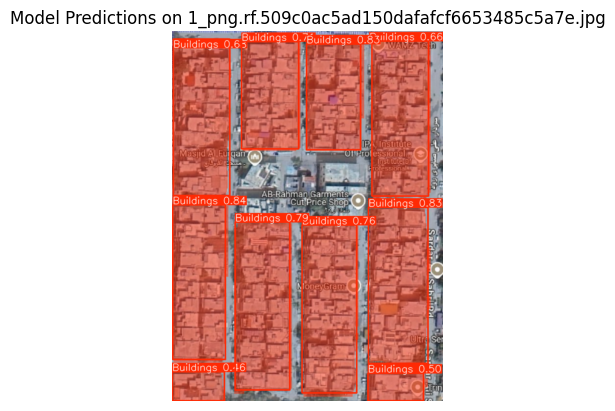

Predictions for 1_png.rf.509c0ac5ad150dafafcf6653485c5a7e.jpg:
Label: 0.0, Confidence: 0.8352, Coordinates: [1.7062766551971436, 353.34661865234375, 108.70394897460938, 667.6810913085938]
Label: 0.0, Confidence: 0.8325, Coordinates: [273.54925537109375, 26.54496192932129, 383.9082336425781, 241.16769409179688]
Label: 0.0, Confidence: 0.8311, Coordinates: [399.7642822265625, 358.8271789550781, 520.376220703125, 675.9830322265625]
Label: 0.0, Confidence: 0.7928, Coordinates: [128.10238647460938, 388.7837829589844, 239.73069763183594, 729.1552124023438]
Label: 0.0, Confidence: 0.7609, Coordinates: [264.4847717285156, 394.2650146484375, 375.57269287109375, 735.3152465820312]
Label: 0.0, Confidence: 0.7113, Coordinates: [141.710205078125, 21.504806518554688, 257.68389892578125, 239.03485107421875]
Label: 0.0, Confidence: 0.6797, Coordinates: [2.800992488861084, 16.939952850341797, 117.56163024902344, 334.67181396484375]
Label: 0.0, Confidence: 0.6640, Coordinates: [406.77252197265625, 20.16

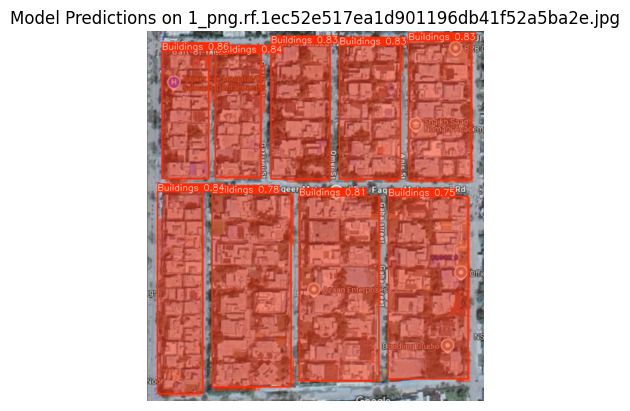

Predictions for 1_png.rf.1ec52e517ea1d901196db41f52a5ba2e.jpg:
Label: 0.0, Confidence: 0.8625, Coordinates: [33.81268310546875, 43.174373626708984, 137.21409606933594, 329.50970458984375]
Label: 0.0, Confidence: 0.8402, Coordinates: [23.680145263671875, 358.4466857910156, 124.84358215332031, 809.4066162109375]
Label: 0.0, Confidence: 0.8360, Coordinates: [152.1575927734375, 49.8563346862793, 254.794189453125, 326.5022888183594]
Label: 0.0, Confidence: 0.8342, Coordinates: [583.6762084960938, 21.101449966430664, 723.3762817382812, 332.22119140625]
Label: 0.0, Confidence: 0.8322, Coordinates: [429.8508605957031, 31.788156509399414, 565.8583374023438, 330.6976318359375]
Label: 0.0, Confidence: 0.8307, Coordinates: [276.0621337890625, 28.060792922973633, 408.6768798828125, 330.7887268066406]
Label: 0.0, Confidence: 0.8132, Coordinates: [339.5367126464844, 368.0634460449219, 517.1112670898438, 780.6129150390625]
Label: 0.0, Confidence: 0.7794, Coordinates: [145.65696716308594, 362.935058593

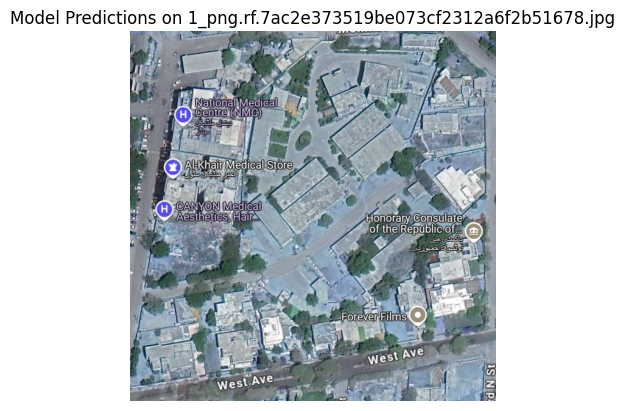

Predictions for 1_png.rf.7ac2e373519be073cf2312a6f2b51678.jpg:

image 1/1 /kaggle/input/samples/2_png.rf.30aa4b8eb866d2e499b2e6c13ec1f30d.jpg: 512x384 6 Buildingss, 16.6ms
Speed: 1.5ms preprocess, 16.6ms inference, 2.9ms postprocess per image at shape (1, 3, 512, 384)


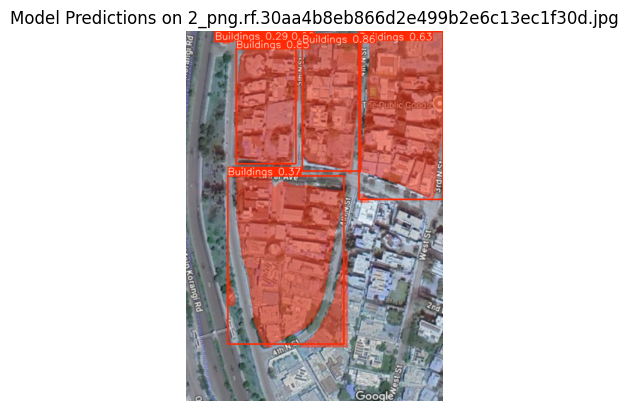

Predictions for 2_png.rf.30aa4b8eb866d2e499b2e6c13ec1f30d.jpg:
Label: 0.0, Confidence: 0.8611, Coordinates: [237.36082458496094, 6.8045196533203125, 356.5152587890625, 286.6209716796875]
Label: 0.0, Confidence: 0.8468, Coordinates: [102.20699310302734, 36.33336639404297, 224.0311279296875, 271.5584411621094]
Label: 0.0, Confidence: 0.6280, Coordinates: [353.83843994140625, 1.0486054420471191, 524.8941650390625, 344.5643005371094]
Label: 0.0, Confidence: 0.3746, Coordinates: [85.14152526855469, 296.306396484375, 322.79766845703125, 640.7803344726562]
Label: 0.0, Confidence: 0.2858, Coordinates: [59.67893600463867, 0.622596800327301, 95.1791763305664, 21.188053131103516]
Label: 0.0, Confidence: 0.2562, Coordinates: [112.05323791503906, 0.0, 181.60560607910156, 11.85796070098877]


In [9]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

# Load the trained model
model_path = "/kaggle/working/output_model/epoc2/weights/best.pt"  # Update with your trained model's path
model = YOLO(model_path)

# Path to the directory containing your unannotated sample images
samples_dir = "/kaggle/input/samples"  # Update with the correct directory path

# Create a directory to save the results
output_dir = "/kaggle/working/inference_results"
os.makedirs(output_dir, exist_ok=True)

# Iterate through all image files in the samples directory
for img_filename in os.listdir(samples_dir):
    # Check if the file is an image (you can extend this with more extensions if needed)
    if img_filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        sample_image_path = os.path.join(samples_dir, img_filename)
        
        # Perform inference on the image
        results = model(sample_image_path)

        # Access the first result (the image you passed for testing)
        result = results[0]

        # Annotate the image with predictions
        annotated_image_np = result.plot()  # Get the annotated image as a NumPy array

        # Convert NumPy array to a PIL image
        annotated_image = Image.fromarray(np.uint8(annotated_image_np))

        # Save the annotated image to a file
        annotated_image_path = os.path.join(output_dir, f"annotated_{img_filename}")
        annotated_image.save(annotated_image_path)

        # Display the annotated image
        plt.imshow(annotated_image)
        plt.axis("off")
        plt.title(f"Model Predictions on {img_filename}")
        plt.show()

        # Print the predictions (bounding boxes, labels, confidence scores)
        print(f"Predictions for {img_filename}:")
        for i in range(len(result.boxes)):
            # Access the class, confidence, and coordinates
            label = result.boxes.cls[i].item()  # Get the class index (e.g., 'Buildings')
            confidence = result.boxes.conf[i].item()  # Confidence score
            coordinates = result.boxes.xyxy[i].tolist()  # Bounding box coordinates [x1, y1, x2, y2]

            print(f"Label: {label}, Confidence: {confidence:.4f}, Coordinates: {coordinates}")
        print("="*50)  # Separator between results of different images
